<a href="https://colab.research.google.com/github/KwonYN/TIL/blob/master/PYTHON/TENSORFLOW2/7_kyn_report_day_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

02-04 ~ 03-01의 과제는 수업시간 및 쉬는시간에 이미 다 해놓은 상태이기 때문에 코드를 그대로 놓겠습니다.
그 이후는 원본 Update 파일에 구현하고, 저의 분석을 정리해놓았습니다.



## **02-04_csv_file_handling_mnist_7_kyn**
### 과제1 이 dataset을 오늘 실습한 model로 training해 보자.
#### -- 02_03 코드를 02_03_01로 복사하고 Data set을 위에 있는 np.loadtxt()를 사용하도록 수정하여 실행하자.







In [0]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

TensorFlow 2.x selected.


In [0]:
from __future__ import absolute_import, division, print_function, unicode_literals
import functools

import numpy as np
import tensorflow as tf

In [0]:
import sys
from google.colab import drive

drive.mount('/content/drive')
sys.path.append('/content/drive/Shared drives/scsa_2019_c/07_kyn')

import aidlutils as aidl

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
import pandas as pd



> ### Data Load



In [0]:
mnist_csv_train = '/content/sample_data/mnist_train_small.csv'
minst_csv_test = '/content/sample_data/mnist_test.csv'

data_train=np.loadtxt(mnist_csv_train, delimiter=',') #delimiter지정필요
data_test=np.loadtxt(minst_csv_test, delimiter=',')

In [0]:
print("shape of data_train : {}, shape of data_test : {}, type of data_train : {}".format(data_train.shape, data_test.shape, type(data_train)))

shape of data_train : (20000, 785), shape of data_test : (10000, 785), type of data_train : <class 'numpy.ndarray'>


In [0]:
x_train, y_train = data_train[:, 1:], data_train[:, 0]
x_test, y_test = data_test[:, 1:], data_test[:, 0]



> ### Data 가공 



In [0]:
# add a channel dimension
x_train = x_train.reshape(-1, 28, 28, 1)
x_test = x_test.reshape(-1, 28, 28, 1)

x_train.shape, x_test.shape

((20000, 28, 28, 1), (10000, 28, 28, 1))



> ### Sequential Model



Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_32 (Conv2D)             (None, 28, 28, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_10 (Dense)             (None, 10)                62730     
Total params: 63,050
Trainable params: 63,050
Non-trainable params: 0
_________________________________________________________________


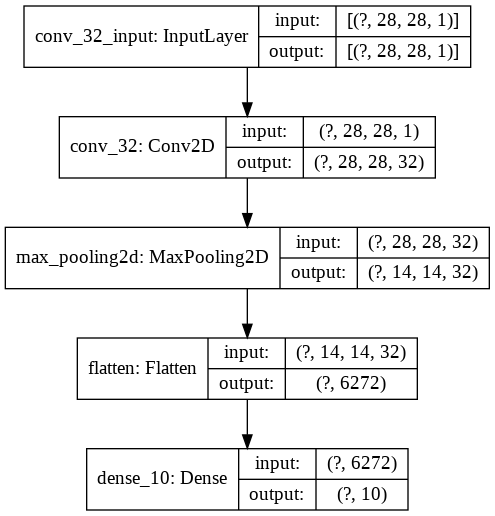

In [0]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu', 
                         input_shape=(28,28,1), name='conv_32'),
  tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=(2,2)),
  tf.keras.layers.Flatten(name='flatten'),
  tf.keras.layers.Dense(10, activation='softmax', name='dense_10')
])    # Conv2D에서는 input_shape로 4차원이 들어가야 함!!1  그래서 바로 위에서 차원을 1 올려준 것! 그런데 왜 3개? : 맨 앞은 Batch size이기 때문!!


# Model 잘 만들어졌는지 확인!
model.summary()
tf.keras.utils.plot_model(model, 'my_cnn_model.png', show_shapes=True)



> ### Compile



In [0]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])



> ### Before Training



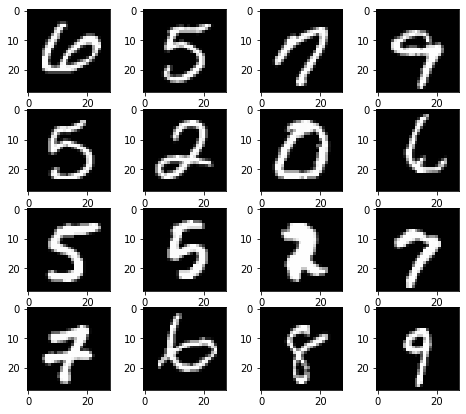

In [0]:
import matplotlib.pyplot as plt

aidl.show_img(x_train)



> ### Fit



In [0]:
%%time
history = model.fit(x_train, y_train, 
                 batch_size=512, epochs=30,
                 validation_data=(x_test, y_test)
                 )

Train on 20000 samples, validate on 10000 samples
Epoch 1/30
20000/20000 [==============================] - 10s 484us/sample - loss: 7.4350 - accuracy: 0.7186 - val_loss: 1.3582 - val_accuracy: 0.9049
Epoch 2/30
20000/20000 [==============================] - 9s 443us/sample - loss: 0.9306 - accuracy: 0.9258 - val_loss: 0.6607 - val_accuracy: 0.9384
Epoch 3/30
20000/20000 [==============================] - 9s 447us/sample - loss: 0.4270 - accuracy: 0.9517 - val_loss: 0.4354 - val_accuracy: 0.9520
Epoch 4/30
20000/20000 [==============================] - 9s 448us/sample - loss: 0.2518 - accuracy: 0.9650 - val_loss: 0.3346 - val_accuracy: 0.9603
Epoch 5/30
20000/20000 [==============================] - 9s 457us/sample - loss: 0.1262 - accuracy: 0.9779 - val_loss: 0.3020 - val_accuracy: 0.9637
Epoch 6/30
20000/20000 [==============================] - 9s 449us/sample - loss: 0.0728 - accuracy: 0.9851 - val_loss: 0.2994 - val_accuracy: 0.9604
Epoch 7/30
20000/20000 [=========================

In [0]:
model.evaluate(x_test,  y_test, verbose=0)

[0.25092354457162025, 0.9719]



> ### Plot



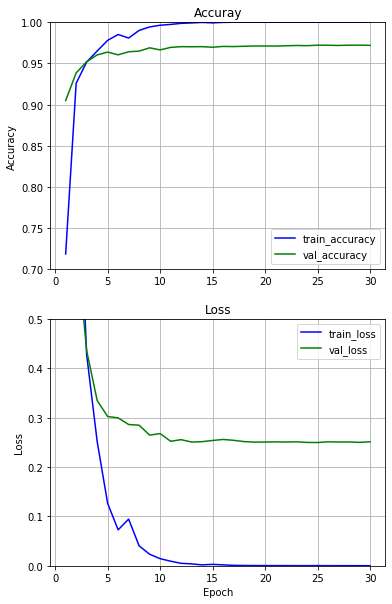

In [0]:
loss = history.history['loss']
epochs = range(1, len(loss)+1)

plt.figure(figsize=(6, 10))
plt.subplot(2, 1, 1)
plt.title('Accuray')
plt.plot(epochs, history.history['accuracy'], 'b', label='train_accuracy')
plt.plot(epochs, history.history['val_accuracy'], 'g', label='val_accuracy')

plt.grid(True)
plt.ylabel('Accuracy')
plt.ylim([0.7, 1])
plt.legend(loc='best')

plt.subplot(2, 1, 2)
plt.title('Loss')
plt.plot(epochs, history.history['loss'], 'b', label='train_loss')
plt.plot(epochs, history.history['val_loss'], 'g', label='val_loss')
plt.grid(True)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim([0.0, 0.5])
plt.legend(loc='best')
plt.show()



> ### Prediction



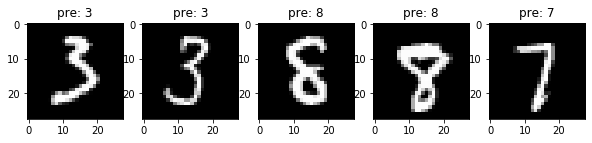

In [0]:
def model_eval(model, n=230):
  #n = 230
  plt.figure(figsize=(10, 2))
  for i in range(5):
    img_idx = n+i
    predict = model.predict(x_test[img_idx:img_idx+1, :])
    img = x_test[img_idx]
    plt.subplot(1,5,i+1)
    plt.imshow(img.reshape((28,28)), cmap='gray')
    plt.title('pre: {}'.format(np.argmax(predict)))

  plt.show()

model_eval(model)

===================================================================================================================

## **02_06_Image_basic_7_kyn.ipynb**


> ### 과제 1. `ImageDataGenerator()`의 option 값들 바꾸어 결과를 확인하자



In [0]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

import tensorflow as tf
import IPython.display as display
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

# tf.keras.preprocessing.image import
import tensorflow.keras as keras 

import pathlib

### get photo and path

/content/drive/My Drive/20170930_134723.jpg <class 'pathlib.PosixPath'>
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4128x3096 at 0x7F6A651C3F28>




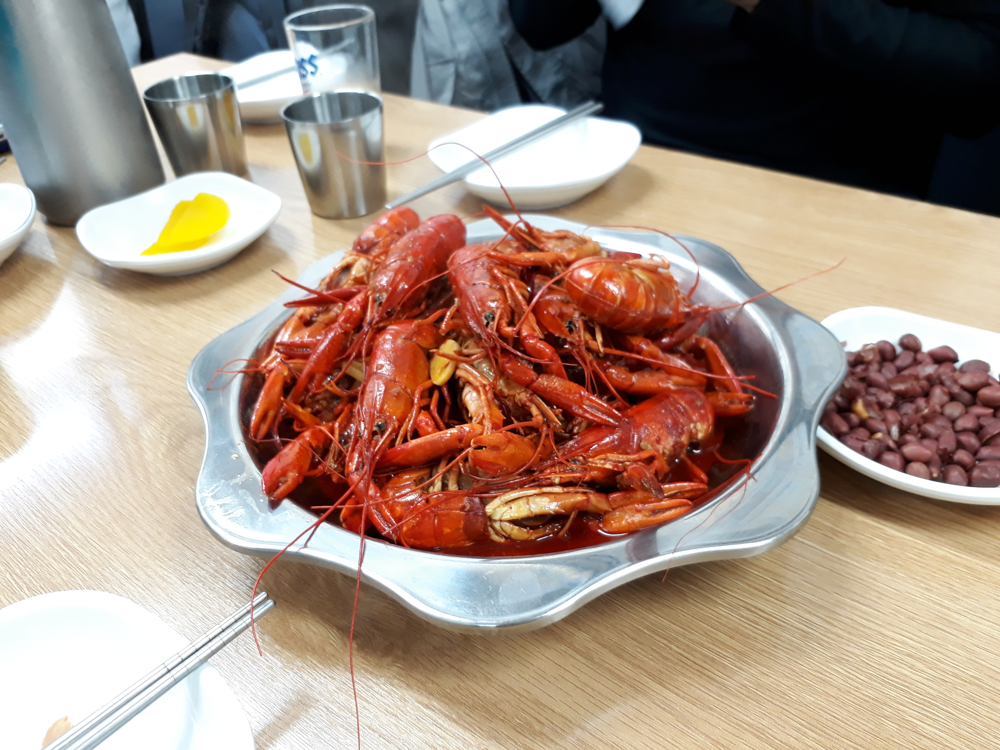

In [0]:
# image path
data_dir_gd = pathlib.Path(
    '/content/drive/My Drive/20170930_134723.jpg')
print(data_dir_gd, type(data_dir_gd))

img = keras.preprocessing.image.load_img(data_dir_gd)
print(img, end='\n\n\n')
img

### image processing function
#### -- inputs
>dg: ImageDataGenerator   
>imgs: image tensor

In [0]:
# image data generator로 부터 image를 받아서 출력 
def k_image_process(dg, imgs):

  # batch_size 만큼씩 처리하도록 준비 - ImageGenerator의 메소드 flow
  it = dg.flow(imgs, batch_size=1)
  plt.figure(figsize=(12,9))

  # generate samples and plot
  for i in range(9):
    # define subplot
    plt.subplot(330 + 1 + i)
    #batch_size씩 가져옴
    batch = it.next() 
    # plt을 위해 type 변경 
    image = batch[0].astype('uint8')
    # plot raw pixel data
    plt.imshow(image)

  # show the figure
  plt.show()


### image preprocessing: 3-dim to 4-dim array



In [0]:
# ImageDataGenerator()에 넣을 수 있도록 (batch size, height, width, channel)로 변환

# convert to numpy array - img_to_array라는 메서드가 있네 ㄷㄷ
data = keras.preprocessing.image.img_to_array(img)

print(type(data), data.shape)

# expand dimension to one sample
batch_image = np.expand_dims(data, 0)   # axis 0, 즉 가장 앞의 dimension을 추가시켜주는 것!! (1로)
print(type(batch_image), batch_image.shape)

<class 'numpy.ndarray'> (3096, 4128, 3)
<class 'numpy.ndarray'> (1, 3096, 4128, 3)




> ### Image Shifting


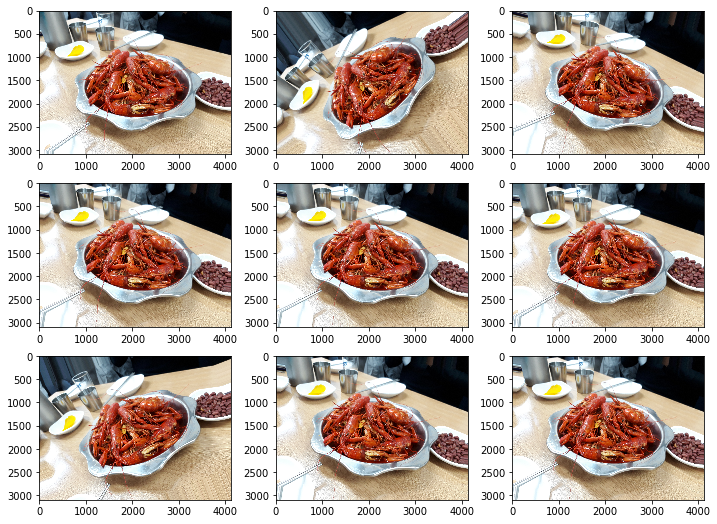

In [0]:
#datagen = keras.preprocessing.image.ImageDataGenerator(width_shift_range=0.9) # width_shift
#datagen = keras.preprocessing.image.ImageDataGenerator(height_shift_range=0.5) # height_shift
#datagen = keras.preprocessing.image.ImageDataGenerator(horizontal_flip=True, vertical_flip=True)  # image_flip
datagen = keras.preprocessing.image.ImageDataGenerator(rotation_range=45) # image rotate
#datagen = keras.preprocessing.image.ImageDataGenerator(zoom_range=0.2) # zoom_range=[0.8,1.2]
#datagen = keras.preprocessing.image.ImageDataGenerator(brightness_range=[0.1, 3.0]) # brightness shift

k_image_process(datagen, batch_image)


> ### 과제 2. `ImageDataGenerator()`에 여러 option을 넣어 동시에 작동하도록 해보자

####  -- `k_image_process()`를 수정하여 4x3 으로 이미지를 출력해 보자

#### -- 결과를 확인 하자 : 

In [0]:
def new_k_image_process(dg, imgs):

  # batch_size 만큼씩 처리하도록 준비 - ImageGenerator의 메소드 flow
  it = dg.flow(imgs, batch_size=1)
  plt.figure(figsize=(3.0, 4.0))  # 왜 사이즈 비율(?)이 안 변하지..?
  plt.figure()

  for i in range(12):
    plt.subplot(3, 4, i+1)
    batch = it.next() 
    image = batch[0].astype('uint8')
    plt.imshow(image)
    plt.axis("off")

  plt.show()

<Figure size 216x288 with 0 Axes>

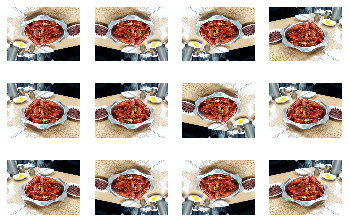

In [0]:
datagen = keras.preprocessing.image.ImageDataGenerator(horizontal_flip=True, vertical_flip=True)

new_k_image_process(datagen, batch_image)

===================================================================================================================

## **03_01_rnn_stock_7_kyn.ipynb**

### 과제 1. `timesteps = seq_length = 7`를 줄여보자 
#### -- model_B에서 5,3,1로 줄이고 결과를 비교하자:



> #### < 결과 분석 >

##### seq_length가 감소할수록 val_loss_b의 떨림(?)이 감소하고, 실제 주가와 예측 주가의 괴리가 줄어드는 경향을 보였다.(것처럼 보인다.) 이는 원래는 1주일치의 주가 데이터를 통해 학습했을 때보다 어제의 주가 데이터를 통해 학습하여 예측했을 때, 

In [0]:
%tensorflow_version 2.x

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
print("tensorflow version : ", end='')
tf.__version__


from google.colab import drive
drive.mount('/content/drive')


import pandas as pd
# data file path declare
stock_file = '/content/drive/Shared drives/scsa_2019_e/z_data/data-02-stock_daily.csv'
# read the data file
pd_data = pd.read_csv(stock_file)
# 처음 몇개 자료 확인
pd_data.head()

tensorflow version : Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,,,,# http://finance.yahoo.com/quote/GOOG/history?ltr=1
# Open,High,Low,Volume,Close
828.659973,833.450012,828.349976,1247700,831.659973
823.02002,828.070007,821.655029,1597800,828.070007
819.929993,824.400024,818.97998,1281700,824.159973
819.359985,823,818.469971,1304000,818.97998




> ### Check dataset





> ### Preprocessing



In [0]:
# 최대,최소값으로 정규화 하기
def MinMaxScaler(data):
  numerator = data - np.min(data, 0)
  denominator = (np.max(data, 0) - np.min(data, 0)) + 1e-7
  return numerator/denominator

In [0]:
# data loading: csv file에서 숫자 데이터를 ndarray로 load
xy = np.loadtxt(stock_file, delimiter=',')
print(xy.shape)

xy = xy[::-1]           # 과거부터로 정렬 (chronically ordered) - 역으로 순서 바꾼 것!
xy = MinMaxScaler(xy)   # minmax 정규화
x = xy                  # input data(Open,High,Low,Volume)
y = xy[:, [-1]]         # 종가만 slicing -> target data  - 시작부터 끝까지(행 단위) 가장 마지막(열) 데이터만!! == 그리고 그것이 종가!

# data type 확인
print ("SHAPE OF X IS %s" % (x.shape,))
print ("SHAPE OF Y IS %s" % (y.shape,))

(732, 5)
SHAPE OF X IS (732, 5)
SHAPE OF Y IS (732, 1)


In [0]:
# sequence generator
timesteps = seq_length = 5
data_dim  = 5
dataX = []
dataY = []
for i in range(0, len(y) - seq_length):
    _x = x[i:i + seq_length] # 7일치 데이터
    _y = y[i + seq_length]   # 다음날 종가
    dataX.append(_x)
    dataY.append(_y)

# train data : test data = 7 : 3
train_size = int(len(dataY) * 0.7)
test_size  = len(dataY) - train_size
x_train = np.array(dataX[0:train_size])
y_train = np.array(dataY[0:train_size])
x_test  = np.array(dataX[train_size:len(dataX)])
y_test  = np.array(dataY[train_size:len(dataY)])

In [0]:
def print_np(_name, _x):
    print("TYPE  OF [%s] is [%s]" % (_name, type(_x)))
    print("SHAPE OF [%s] is %s" % (_name, _x.shape))
    print()

In [0]:
print_np('x_train', x_train)
print_np('y_train', y_train)
print_np('x_test', x_test)
print_np('y_test', y_test)

TYPE  OF [x_train] is [<class 'numpy.ndarray'>]
SHAPE OF [x_train] is (508, 5, 5)

TYPE  OF [y_train] is [<class 'numpy.ndarray'>]
SHAPE OF [y_train] is (508, 1)

TYPE  OF [x_test] is [<class 'numpy.ndarray'>]
SHAPE OF [x_test] is (219, 5, 5)

TYPE  OF [y_test] is [<class 'numpy.ndarray'>]
SHAPE OF [y_test] is (219, 1)




> ### **Model**




> ### Define



In [0]:
hidden_dim = 10

#### Basic LSTM model 

#basic model = LSTM + dense : Layer 2개
model_B = tf.keras.models.Sequential(name='model_basic')  
model_B.add(tf.keras.layers.LSTM(units = hidden_dim, 
              input_shape = (x_train.shape[1], x_train.shape[2])))
model_B.add(tf.keras.layers.Dense(units = 1))


# model summary
model_B.summary()   # basic model



Model: "model_basic"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_16 (LSTM)               (None, 10)                640       
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 11        
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
Model: "model_advanced"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_17 (LSTM)               (None, 5, 10)             640       
_________________________________________________________________
lstm_18 (LSTM)               (None, 5, 10)             840       
_________________________________________________________________
lstm_19 (LSTM)               (None, 10)                840       
_________________________________


> ### Compile and Fit




Epoch 100/100
507/507 [==============================] - 0s 220us/sample - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0019 - val_mse: 0.0019
CPU times: user 17.2 s, sys: 910 ms, total: 18.1 s

Wall time: 14.4 s (@Notebook Setting/GPU)

In [0]:
%%time
# model compile
model_B.compile(optimizer = 'adam', loss = 'mse', metrics=['mse'])

history_B = model_B.fit(x_train, y_train, 
                      validation_data=(x_test, y_test),
                      epochs = 100, batch_size = 32)

Train on 508 samples, validate on 219 samples
Epoch 1/100
508/508 [==============================] - 2s 4ms/sample - loss: 0.1839 - mse: 0.1839 - val_loss: 0.4725 - val_mse: 0.4725
Epoch 2/100
508/508 [==============================] - 0s 167us/sample - loss: 0.0587 - mse: 0.0587 - val_loss: 0.1218 - val_mse: 0.1218
Epoch 3/100
508/508 [==============================] - 0s 166us/sample - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0217 - val_mse: 0.0217
Epoch 4/100
508/508 [==============================] - 0s 171us/sample - loss: 0.0125 - mse: 0.0125 - val_loss: 0.0138 - val_mse: 0.0138
Epoch 5/100
508/508 [==============================] - 0s 172us/sample - loss: 0.0089 - mse: 0.0089 - val_loss: 0.0151 - val_mse: 0.0151
Epoch 6/100
508/508 [==============================] - 0s 181us/sample - loss: 0.0065 - mse: 0.0065 - val_loss: 0.0100 - val_mse: 0.0100
Epoch 7/100
508/508 [==============================] - 0s 175us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0052 - val_mse: 0.00



> ## **Analysis**





> ### Plot



In [0]:
print(history_B.history.keys())   # check generated metrics

dict_keys(['loss', 'mse', 'val_loss', 'val_mse'])


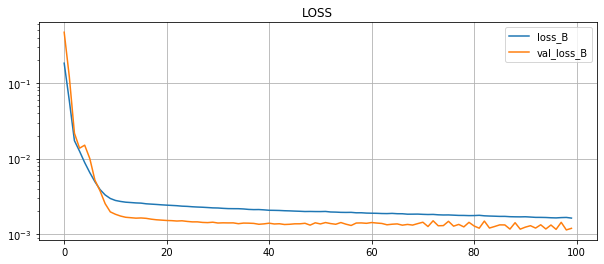

In [0]:
losses_B = history_B.history['loss']
val_loss_B = history_B.history['val_loss']
plt.figure(figsize=(10, 4))
plt.semilogy(losses_B, label='loss_B')
plt.semilogy(val_loss_B, label='val_loss_B')
plt.grid(True)
plt.legend(loc='best')
plt.title("LOSS")
plt.show()  



> ### Predict the stock price



In [0]:
predicted_stock_price_B = model_B.predict(x_test)



> ### Plot the result



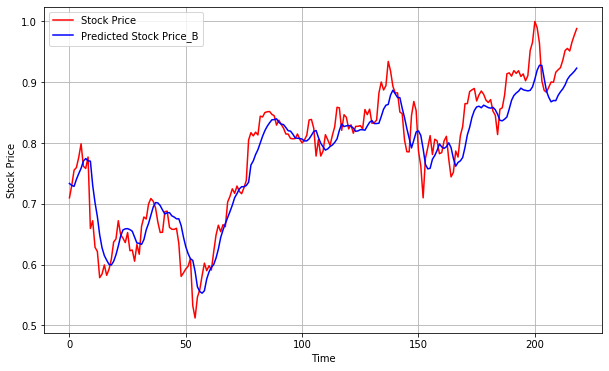

In [0]:
plt.figure(figsize=(10, 6))
plt.plot(y_test, color = 'red', label = 'Stock Price')
plt.plot(predicted_stock_price_B, color = 'blue', label = 'Predicted Stock Price_B')
#plt.title('Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('Stock Price')
plt.legend()
plt.grid(True)
plt.show()



> ### 과제 2. model_A를 교재와 같이 확장시켜 model_A2를 만들어 보자
#### -- dropout layer를 추가하고, 
#### -- LSTM layer도 추가하자
#### -- 결과를 model_B,A,A2에 대해 비교하자:



In [0]:
import tensorflow.keras.layers as tkl


# layer 1
model_A = tf.keras.models.Sequential(name='model_advanced') 
model_A.add(tf.keras.layers.LSTM(units = hidden_dim,
              return_sequences = True, 
              input_shape = (x_train.shape[1], x_train.shape[2])))
# layer 2
model_A.add(tf.keras.layers.LSTM(units = hidden_dim,return_sequences = True))
# layer 3
model_A.add(tf.keras.layers.LSTM(units = hidden_dim))
# dense
model_A.add(tf.keras.layers.Dense(units = 1))



# layer 1
model_A2 = tf.keras.models.Sequential(name='model_advanced2') 
model_A2.add(tkl.LSTM(units = hidden_dim,
              return_sequences = True, 
              input_shape = (x_train.shape[1], x_train.shape[2]), name='model_A_LSTM1'))
model_A2.add(tkl.Dropout(0.2, name='model_A_do1'))

# layer 2
model_A2.add(tkl.LSTM(units = hidden_dim,return_sequences = True, name='model_A_LSTM2'))
model_A2.add(tkl.Dropout(0.2, name='model_A_do2'))

# layer 3
model_A2.add(tkl.LSTM(units = hidden_dim,return_sequences = True, name='model_A_LSTM3'))
model_A2.add(tkl.Dropout(0.2, name='model_A_do3'))

# layer 4
model_A2.add(tkl.LSTM(units = hidden_dim, return_sequences = True, name='model_A_LSTM4'))
model_A2.add(tkl.Dropout(0.2, name='model_A_do4'))

# dense
model_A2.add(tkl.Dense(units = 1, name='model_A_dense1'))

model_A.summary()
print();print();print()
model_A2.summary()   # advanced model


Model: "model_advanced"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_32 (LSTM)               (None, 5, 10)             640       
_________________________________________________________________
lstm_33 (LSTM)               (None, 5, 10)             840       
_________________________________________________________________
lstm_34 (LSTM)               (None, 10)                840       
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 11        
Total params: 2,331
Trainable params: 2,331
Non-trainable params: 0
_________________________________________________________________



Model: "model_advanced2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model_A_LSTM1 (LSTM)         (None, 5, 10)             640       
______________________



> ### Training



In [0]:
%%time
model_A.compile(optimizer = 'adam', loss = 'mse', metrics=['mse'])

history_A = model_A.fit(x_train, y_train, 
                      validation_data=(x_test, y_test),
                      epochs = 100, batch_size = 32)


model_A2.compile(optimizer = 'adam', loss = 'mse', metrics=['mse'])

history_A2 = model_A2.fit(x_train, y_train, 
                      validation_data=(x_test, y_test),
                      epochs = 100, batch_size = 32)

Train on 508 samples, validate on 219 samples
Epoch 1/100
508/508 [==============================] - 7s 14ms/sample - loss: 0.0788 - mse: 0.0788 - val_loss: 0.2136 - val_mse: 0.2136
Epoch 2/100
508/508 [==============================] - 0s 360us/sample - loss: 0.0248 - mse: 0.0248 - val_loss: 0.0281 - val_mse: 0.0281
Epoch 3/100
508/508 [==============================] - 0s 365us/sample - loss: 0.0140 - mse: 0.0140 - val_loss: 0.0286 - val_mse: 0.0286
Epoch 4/100
508/508 [==============================] - 0s 369us/sample - loss: 0.0073 - mse: 0.0073 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 5/100
508/508 [==============================] - 0s 362us/sample - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 6/100
508/508 [==============================] - 0s 373us/sample - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 7/100
508/508 [==============================] - 0s 367us/sample - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0026 - val_mse: 0.0

ValueError: ignored



> ### Plot



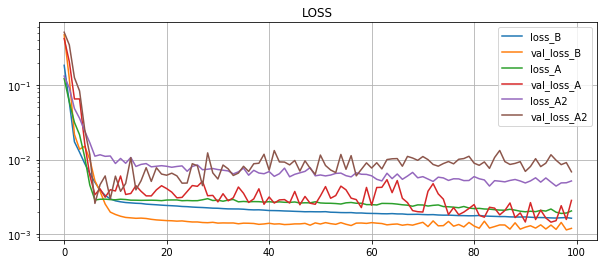

In [0]:
losses_B = history_B.history['loss']
val_loss_B = history_B.history['val_loss']
losses_A = history_A.history['loss']
val_loss_A = history_A.history['val_loss']
losses_A2 = history_A2.history['loss']
val_loss_A2 = history_A2.history['val_loss']

plt.figure(figsize=(10, 4))

plt.semilogy(losses_B, label='loss_B')
plt.semilogy(val_loss_B, label='val_loss_B')
plt.semilogy(losses_A, label='loss_A')
plt.semilogy(val_loss_A, label='val_loss_A')
plt.semilogy(losses_A2, label='loss_A2')
plt.semilogy(val_loss_A2, label='val_loss_A2')

plt.grid(True)
plt.legend(loc='best')
plt.title("LOSS")
plt.show()  

In [0]:
predicted_stock_price_A = model_A.predict(x_test)
predicted_stock_price_A2 = model_A2.predict(x_test)

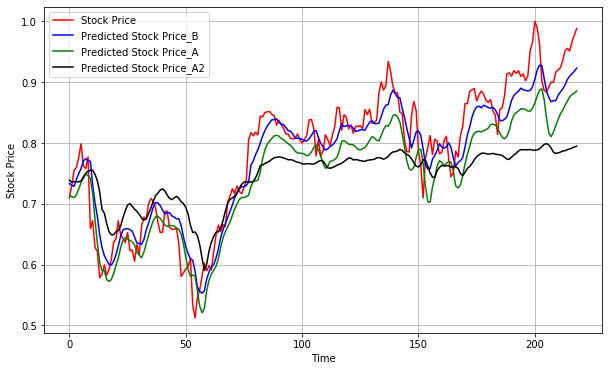

In [0]:
plt.figure(figsize=(10, 6))
plt.plot(y_test, color = 'red', label = 'Stock Price')
plt.plot(predicted_stock_price_B, color = 'blue', label = 'Predicted Stock Price_B')
plt.plot(predicted_stock_price_A, color = 'green', label = 'Predicted Stock Price_A')
plt.plot(predicted_stock_price_A2, color = 'black', label = 'Predicted Stock Price_A2')
#plt.title('Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('Stock Price')
plt.legend()
plt.grid(True)
plt.show()

===================================================================================================================

## **03_02_char_rnn_7_kyn.ipynb**

> ### 과제 1. 더 긴문장을 생성하도록 해보자

####-- 학습문장이 " ...  immensity of the sea."로 끝났다. 첫번째 생성문장이 뒷부분이 이상하다. 180자로 학습한 한계 때문일까? 
#### -- 학습문장 전체를 한번더 반복하여 학습문장을 360자로 확장하고 결과를 비교해 보자
#### -- 결과를 분석하자: 




In [0]:
"""
n_chars가 확장된다고 하더라도 마지막 layer에서 return_sequences=True를 해주지 않는다면,
항상 그 다음 문자만을 예측하고, 이전의 문자들의 배치/단어들은 고려하지 않는 경향(?)이 있다.
그렇기 때문에 학습문장을 확장하더라도 이전과 비슷하게 잘 나오다가 끝부분에서 aa ll.. ess와 같이 이상한 문자들이 나열되는 것을 볼 수 있다.
"""



> ### 과제 2. 세번째 생성문장은 여전히 문제가 많다. 모델을 개선해 보자 
####-- LSTM layer를 추가해 보자 
####-- 더 무엇을 해볼까? 생각해 보자
####-- 결과를 분석하자:



In [0]:
"""
layer를 아무리 추가하더라도 위의 과제 1과 마찬가지로 (마치 문맥을 보듯이) 앞의 단어 배열, 문자 배열을 고려하지 않기 때문에
assniishe mt mtmgg 'fo ottee와 같이 의미 없는 문자들의 나열을 볼 수 있다.
지금이 세 번째 위치(?)라고 가정했을 때, 그 다음 문자만을 예측할 것이 아니라
첫 번째, 두 번째의 문자는 무엇인지를 고려하는 것이 바로 03_02_01의 실습이라고 할 수 있다.
"""

===================================================================================================================

## **03_02_01_char_rnn_7_kyn.ipynb**



> ### 과제 1. 학습문장을 Keras Documents에서 2000자 정도 가져다 넣어서 실행해 보자('.'뒤에'\n'도 넣어주자)


#### -- accuracy가 적당한가 확인하자.
#### -- 모델을 강화 하기 위해 `hidden_dim ='값을 150으로 높히고, 
#### -- `#`로 막혀 있는 `BatchNormalization()`을 동작시켜 보자
#### -- `Trigger characters`를 다양하게 바꿔보자 
#### -- 결과를 확인하고, 분석해 보자:
 


In [0]:
"""
03_02에 비해 이상한 문자들의 나열이 나타나지 않았다.
학습 시, return_sequences=True로 인해 타임 순서에 맞는 문자 및 단어 배치를 고려하여 generate_seq을 비교적 잘 수행하는 모습을 볼 수 있다.
하지만 제 이름의 일부를 쳤을 때, 즉 없는 단어를 쳤을 때 최대한 비슷한 단어들을 찾고 있었다.
이는 여러 가지 단어들의 배열 중에서 가장 비슷한, 즉 확률이 높은 셋을 찾는다는 것을 알 수 있었다.
"""

===================================================================================================================

## **03_03_mnist_rnn_adv_7_kyn.ipynb**



> ### 과제 1. `model_R.fit()`에서 `batch_size=`와 `epochs='값을 조정하여 최적의 값을 찾아 보자

#### -- batch_size 를 32,128,512,1024로 바꾸면서 accuracy값을 비교해 보자 
#### -- 최고의 결과를 낼 batch_size를 예상하고 그 이유를 적어보자 
#### -- 실험 결과와 예상결과를 비교하고, 분석하자 : 



 



> ### 과제 2. epochs를 30,100,200등으로 바꾸어 보자 
####-- batch_size도 같이 조정하여 최적의 조건을 찾아보자 : 



In [0]:
"""
batch 32
epoch 30 : 0.8684
epoch 100 : 0.8771
epoch 200 : 0.8804

batch 64
epoch 30 : 0.8669
epoch 100 : 0.8768
epoch 150 : 0.8785(0.8834) ★
epoch 200 : 0.8787

batch 64 (2)
epoch 30 : 0.8693
epoch 100 : 0.8824
epoch 200 : 0.8837

batch 128
epoch 30 : 0.8645
epoch 100 : 0.8796
epoch 200 : 0.8815

batch 256
epoch 30 : 0.8524
epoch 100 : 0.8747
epoch 200 : 0.8819

batch 512
epoch 30 : 0.8404
epoch 100 : 0.8705
epoch 200 : 0.8766

batch 1024
epoch 30 : 0.8347
epoch 100 : 0.8609
epoch 200 : 0.8731
-------------------------------------------------------
3차원 그래프를 보면, batch size가 작을수록, epochs가 클수록 학습의 정확도가 높다는 경향을 볼 수 있다.
너무 많은 양의 데이터를 한꺼번에 처리하는 것보다, 그리고 전체 학습의 양이 적은 것보다는
적당한 양의 데이터를 한꺼번에 적당한 횟수 Training 시켜주는 것이 좋다.
  - 너무 과하면 Overfitting의 위험이 있음
  - 너무 적으면 Underfitting의 위험이 있음
그래서 저희 조의 최적 조건은 batch size = 64, epoch = 150일 때였다.
"""

===================================================================================================================